In [65]:
(1 / LCD.TRAIN_CLASS_COUNTS[2:])* LCD.TRAIN_CLASS_COUNTS[2:].sum() / (LCD.N_CLASSES-2)

array([2.48438814e+00, 3.74234916e-01, 5.46819219e-01, 1.57013485e+00,
       4.54326487e-01, 1.54957668e+01, 1.41433886e+05, 5.15142753e+00])

In [67]:
LCD.TRAIN_CLASS_COUNTS[2:]

array([ 60971025, 404760981, 277012377,  96473046, 333407133,   9775295,
            1071,  29404605])

In [70]:
temp = (1 / LCD.TRAIN_CLASS_COUNTS[0:])* LCD.TRAIN_CLASS_COUNTS[0:].sum() / (LCD.N_CLASSES-2)

C:\Users\Mohammad\AppData\Local\Temp/ipykernel_3448/757796890.py:1: RuntimeWarning: divide by zero encountered in true_divide
  temp = (1 / LCD.TRAIN_CLASS_COUNTS[0:])* LCD.TRAIN_CLASS_COUNTS[0:].sum() / (LCD.N_CLASSES-2)


In [72]:
temp[LCD.IGNORED_CLASSES_IDX] = 0
temp

array([0.00000000e+00, 0.00000000e+00, 2.48443047e+00, 3.74241291e-01,
       5.46828534e-01, 1.57016160e+00, 4.54334227e-01, 1.54960308e+01,
       1.41436295e+05, 5.15151528e+00])

In [74]:
len(temp)

10

In [110]:
class_unweighted

[0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1]

In [77]:
class_unweighted = [1/10 for i in range(10)]

In [82]:
class_weight

array([0.00000000e+00, 0.00000000e+00, 1.98754437e+00, 2.99393033e-01,
       4.37462827e-01, 1.25612928e+00, 3.63467381e-01, 1.23968246e+01,
       1.13149036e+05, 4.12121223e+00])

In [91]:
multiprocessing.cpu_count()

16

In [102]:
import keras.backend as K

In [ ]:
"""
Train the model.
"""
from pathlib import Path
import datetime
import argparse
import yaml
import random
import numpy as np
import pandas as pd
import tensorflow as tf

from dataset import LandCoverData as LCD
from dataset import parse_image, load_image_train, load_image_test
from model import UNet
from tensorflow_utils import plot_predictions
from utils import YamlNamespace

class PlotCallback(tf.keras.callbacks.Callback):
    """A callback used to display sample predictions during training."""
    from IPython.display import clear_output

    def __init__(self, dataset: tf.data.Dataset=None,
                 sample_batch: tf.Tensor=None,
                 save_folder: Path=None,
                 num: int=1,
                 ipython_mode: bool=False):
        super(PlotCallback, self).__init__()
        self.dataset = dataset
        self.sample_batch = sample_batch
        self.save_folder = save_folder
        self.num = num
        self.ipython_mode = ipython_mode

    def on_epoch_begin(self, epoch, logs=None):
        if self.ipython_mode:
            self.clear_output(wait=True)
        if self.save_folder:
            save_filepaths = [self.save_folder/f'plot_{n}_epoch{epoch}.png' for n in range(1, self.num+1)]
        else:
            save_filepaths = None
        plot_predictions(self.model, self.dataset, self.sample_batch, num=self.num, save_filepaths=save_filepaths)


def _parse_args():
    #parser = argparse.ArgumentParser('Training script')
    #parser.add_argument('--config', '-c', type=str, required=True, help="The YAML config file")
    #cli_args = parser.parse_args()
    #cli_args = "--config train_config.yaml"
    # parse the config file
    #with open(cli_args.config, 'r') as f:
    with open('C:/Users/Mohammad/Documents/M2A/AppAuto/challenge-ens/framework/train_config.yaml', 'r') as f:
        config = yaml.load(f, Loader=yaml.FullLoader)
    config = YamlNamespace(config)
    config.xp_rootdir = Path(config.xp_rootdir).expanduser()
    assert config.xp_rootdir.is_dir()
    config.dataset_folder = Path(config.dataset_folder).expanduser()
    assert config.dataset_folder.is_dir()
    if config.val_samples_csv is not None:
        config.val_samples_csv = Path(config.val_samples_csv).expanduser()
        assert config.val_samples_csv.is_file()

    return config

if __name__ == '__main__':

    import multiprocessing

    config = _parse_args()
    print(f'Config:\n{config}')
    # set random seed for reproducibility
    if config.seed is not None:
        random.seed(config.seed)
        np.random.seed(config.seed)
        tf.random.set_seed(config.seed)

    N_CPUS = multiprocessing.cpu_count()

    print('Instanciate train and validation datasets')
    train_files = list(config.dataset_folder.glob('train/images/*.tif'))
    # shuffle list of training samples files
    train_files = random.sample(train_files, len(train_files))
    devset_size = len(train_files)
    # validation set
    if config.val_samples_csv is not None:
        # read the validation samples
        val_samples_s = pd.read_csv(config.val_samples_csv, squeeze=True)
        val_files = [config.dataset_folder/'train/images/{}.tif'.format(i) for i in val_samples_s]
        train_files = [f for f in train_files if f not in set(val_files)]
        valset_size = len(val_files)
        trainset_size = len(train_files)
        assert valset_size + trainset_size == devset_size
    else:
        # generate a hold-out validation set from the training set
        valset_size = int(len(train_files) * 0.1)
        train_files, val_files = train_files[valset_size:], train_files[:valset_size]
        trainset_size = len(train_files) - valset_size

    train_dataset = tf.data.Dataset.from_tensor_slices(list(map(str, train_files)))\
        .map(parse_image, num_parallel_calls=N_CPUS)
    val_dataset = tf.data.Dataset.from_tensor_slices(list(map(str, val_files)))\
        .map(parse_image, num_parallel_calls=N_CPUS)

    train_dataset = train_dataset.map(load_image_train, num_parallel_calls=N_CPUS)\
        .shuffle(buffer_size=1024, seed=config.seed)\
        .repeat()\
        .batch(config.batch_size)\
        .prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

    val_dataset = val_dataset.map(load_image_test, num_parallel_calls=N_CPUS)\
        .repeat()\
        .batch(config.batch_size)\
        .prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

    # where to write files for this experiments
    xp_dir = config.xp_rootdir / datetime.datetime.now().strftime("%d-%m-%Y_%H-%M-%S")
    #xp_dir = config.xp_rootdir
    (xp_dir/'tensorboard').mkdir(parents=True)
    (xp_dir/'plots').mkdir()
    (xp_dir/'checkpoints').mkdir()
    # save the validation samples to a CSV
    val_samples_s = pd.Series([int(f.stem) for f in val_files], name='sample_id', dtype='uint32')
    val_samples_s.to_csv(xp_dir/'val_samples.csv', index=False)

    # keep a training minibatch for visualization
    for image, mask in train_dataset.take(1):
        sample_batch = (image[:5, ...], mask[:5, ...])

    callbacks = [
        PlotCallback(sample_batch=sample_batch, save_folder=xp_dir/'plots', num=5),
        tf.keras.callbacks.TensorBoard(
            log_dir=xp_dir/'tensorboard',
            update_freq='epoch'
        ),
        # tf.keras.callbacks.EarlyStopping(patience=10, verbose=1),
        tf.keras.callbacks.ModelCheckpoint(
            filepath=xp_dir/'checkpoints/epoch{epoch}', save_best_only=False, verbose=1
        ),
        tf.keras.callbacks.CSVLogger(
            filename=(xp_dir/'fit_logs.csv')
        ),
        tf.keras.callbacks.ReduceLROnPlateau(
            patience=20,
            factor=0.5,
            verbose=1,
        )
    ]
    # create the U-Net model to train
    unet_kwargs = dict(
        input_shape=(LCD.IMG_SIZE, LCD.IMG_SIZE, LCD.N_CHANNELS),
        num_classes=LCD.N_CLASSES,
        num_layers=2
    )
    print(f"Creating U-Net with arguments: {unet_kwargs}")
    model = UNet(**unet_kwargs)
    print(model.summary())

    # get optimizer, loss, and compile model for training
    optimizer = tf.keras.optimizers.Adam(lr=config.lr)

    # compute class weights for the loss: inverse-frequency balanced
    # note: we set to 0 the weights for the classes "no_data"(0) and "clouds"(1) to ignore these
    #class_weight = (1 / LCD.TRAIN_CLASS_COUNTS[2:])* LCD.TRAIN_CLASS_COUNTS[2:].sum() / (LCD.N_CLASSES-2)
    class_weight = (1 / LCD.TRAIN_CLASS_COUNTS)* LCD.TRAIN_CLASS_COUNTS.sum() / (LCD.N_CLASSES)
    class_weight[LCD.IGNORED_CLASSES_IDX] = 0.
    print(f"Will use class weights: {class_weight}")

    #class_weights=dict(enumerate(class_weight))
    #class_weight=dict(enumerate(class_weight,1))
   
    #class weighting
    def add_sample_weights(image, label, class_weights=class_unweighted):
        # The weights for each class, with the constraint that:
        #     sum(class_weights) == 1.0
        #class_weights = tf.constant([2.0, 2.0, 1.0])
        class_weights = class_weight
        class_weights = class_weights/tf.reduce_sum(class_weights)
        # Create an image of `sample_weights` by using the label at each pixel as an 
        # index into the `class weights` .
        sample_weights = tf.gather(class_weights, indices=tf.cast(label, tf.int32))
        #sample_weights = class_weights
        return (image, label, sample_weights)
    
    
    
#     def weighted_categorical_crossentropy(weights):
#         # weights = [0.9,0.05,0.04,0.01]
#         def wcce(y_true, y_pred):
#             Kweights = tf.keras.constant(weights)
#             if not tf.keras.is_tensor(y_pred): y_pred = tf.keras.constant(y_pred)
#             y_true = tf.keras.cast(y_true, y_pred.dtype)
#             return tf.keras.categorical_crossentropy(y_true, y_pred) * tf.keras.sum(y_true * Kweights, axis=-1)
#         return wcce

    smooth = 1.

    def dice_coef(y_true, y_pred):
        y_true_f = K.flatten(y_true)
        y_pred_f = K.flatten(y_pred)
        intersection = K.sum(y_true_f * y_pred_f)
        return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    
    
    def dice_coef_loss(y_true, y_pred):
        return 1 - dice_coef(y_true, y_pred)
    
    loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False)
#     wloss=weighted_categorical_crossentropy(class_weights)
    
    print("Compile model")
    model.compile(optimizer=optimizer,
                  loss=loss,
                  metrics=[])
                  # metrics = [tf.keras.metrics.Precision(),
                  #            tf.keras.metrics.Recall(),
                  #            tf.keras.metrics.MeanIoU(num_classes=LCD.N_CLASSES)]) # TODO segmentation metrics

    # Launch training
    #model_history = model.fit(train_dataset.map(add_sample_weights), epochs=config.epochs,
    model_history = model.fit(train_dataset, epochs=config.epochs,
    #model_history = model.fit(train_dataset, sample_weight=class_weight, epochs=config.epochs,                          
                              callbacks=callbacks,
                              steps_per_epoch=trainset_size // config.batch_size,
                              validation_data=val_dataset,
                              validation_steps=valset_size // config.batch_size,
                              #class_weight=class_weights
                              )



Config:
YamlNamespace(batch_size=8, dataset_folder=WindowsPath('C:/Users/Mohammad/Documents/M2A/AppAuto/challenge-ens/data/dataset_UNZIPPED'), epochs=100, lr=0.01, seed=42, val_samples_csv=None, xp_rootdir=WindowsPath('C:/Users/Mohammad/Documents/M2A/AppAuto/challenge-ens/code/experiments'))
Instanciate train and validation datasets
Creating U-Net with arguments: {'input_shape': (256, 256, 4), 'num_classes': 10, 'num_layers': 2}
Model: "unet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 4) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 64) 2368        input_1[0][0]                    
__________________________________________________________

C:\Users\Mohammad\anaconda3\envs\AMAL\lib\site-packages\keras\optimizer_v2\optimizer_v2.py:355: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  warnings.warn(
C:\Users\Mohammad\AppData\Local\Temp/ipykernel_15248/1881463039.py:164: RuntimeWarning: divide by zero encountered in true_divide
  class_weight = (1 / LCD.TRAIN_CLASS_COUNTS)* LCD.TRAIN_CLASS_COUNTS.sum() / (LCD.N_CLASSES)


1849/1849 [==============================] - 315s 167ms/step - loss: 2.0111e-05 - val_loss: 1.1226

Epoch 00001: saving model to C:\Users\Mohammad\Documents\M2A\AppAuto\challenge-ens\code\experiments\21-11-2021_15-24-26\checkpoints\epoch1
INFO:tensorflow:Assets written to: C:\Users\Mohammad\Documents\M2A\AppAuto\challenge-ens\code\experiments\21-11-2021_15-24-26\checkpoints\epoch1\assets
Epoch 2/100
1849/1849 [==============================] - 312s 167ms/step - loss: 2.1584e-05 - val_loss: 1.0925

Epoch 00002: saving model to C:\Users\Mohammad\Documents\M2A\AppAuto\challenge-ens\code\experiments\21-11-2021_15-24-26\checkpoints\epoch2
INFO:tensorflow:Assets written to: C:\Users\Mohammad\Documents\M2A\AppAuto\challenge-ens\code\experiments\21-11-2021_15-24-26\checkpoints\epoch2\assets
Epoch 3/100
1849/1849 [==============================] - 313s 168ms/step - loss: 9.1974e-06 - val_loss: 1.1341

Epoch 00003: saving model to C:\Users\Mohammad\Documents\M2A\AppAuto\challenge-ens\code\experi

C:\Users\Mohammad\Documents\M2A\AppAuto\challenge-ens\framework\tensorflow_utils.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, len(display_list), figsize=(18, 18))


1849/1849 [==============================] - 313s 168ms/step - loss: 8.4713e-06 - val_loss: 1.0393

Epoch 00005: saving model to C:\Users\Mohammad\Documents\M2A\AppAuto\challenge-ens\code\experiments\21-11-2021_15-24-26\checkpoints\epoch5
INFO:tensorflow:Assets written to: C:\Users\Mohammad\Documents\M2A\AppAuto\challenge-ens\code\experiments\21-11-2021_15-24-26\checkpoints\epoch5\assets
Epoch 6/100
 270/1849 [===>..........................] - ETA: 4:14 - loss: 7.0644e-06

KeyboardInterrupt: 

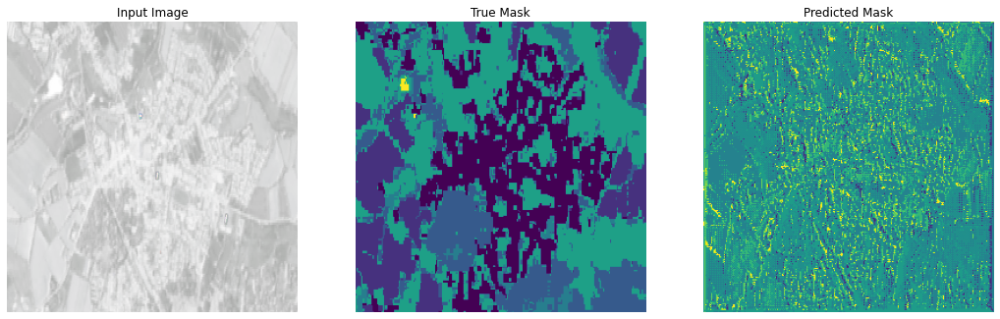

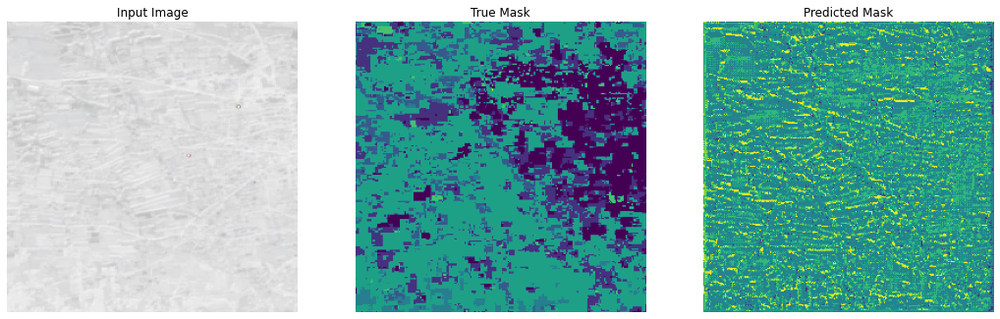

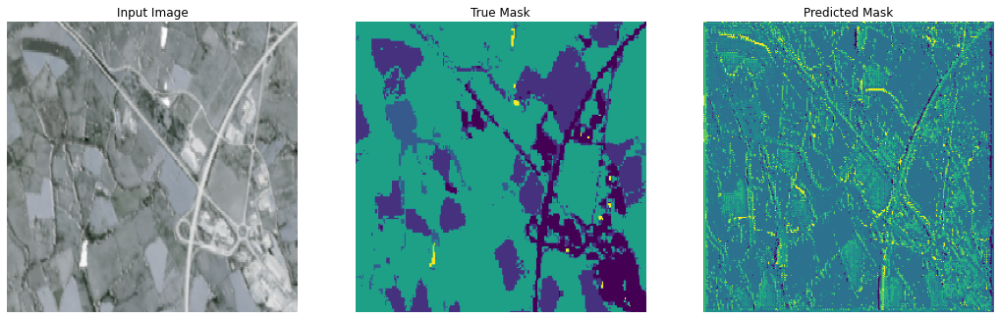

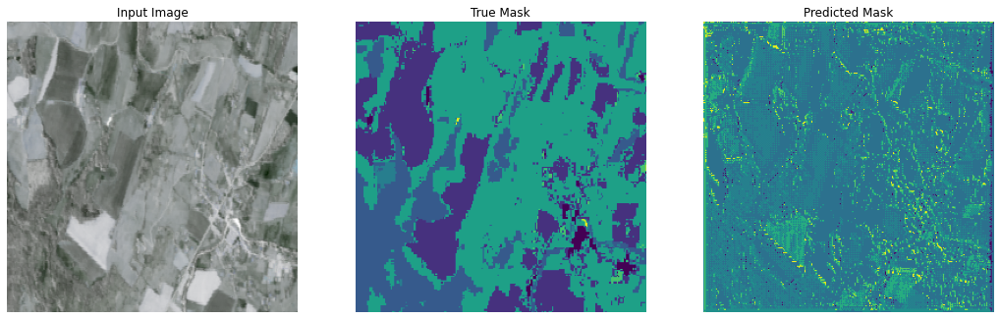

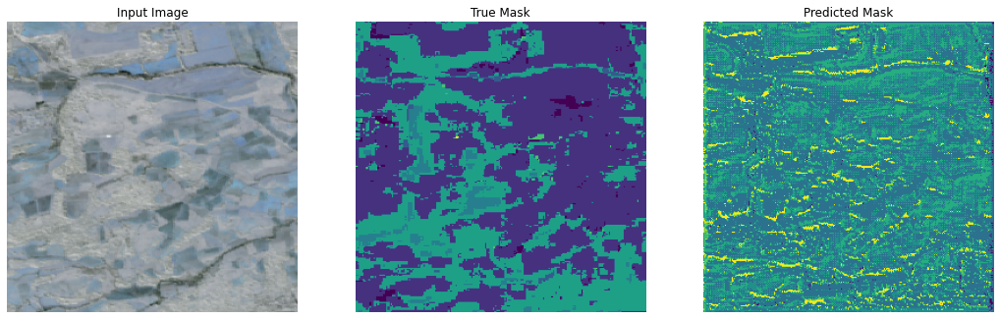

...

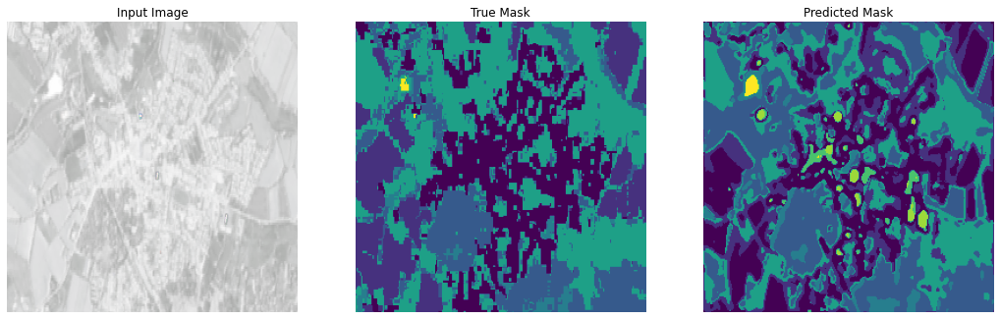

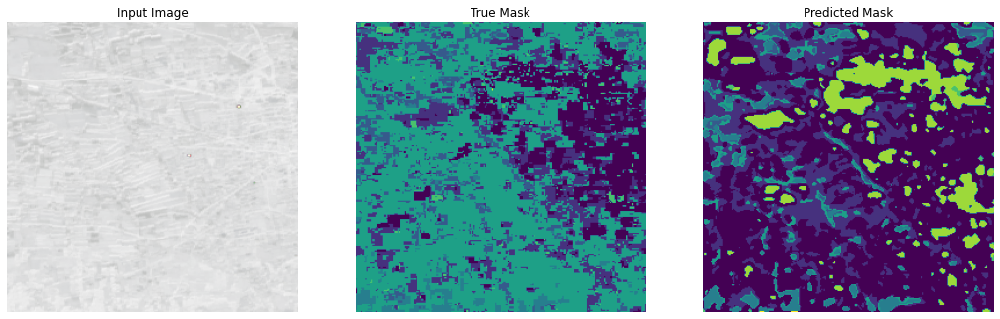

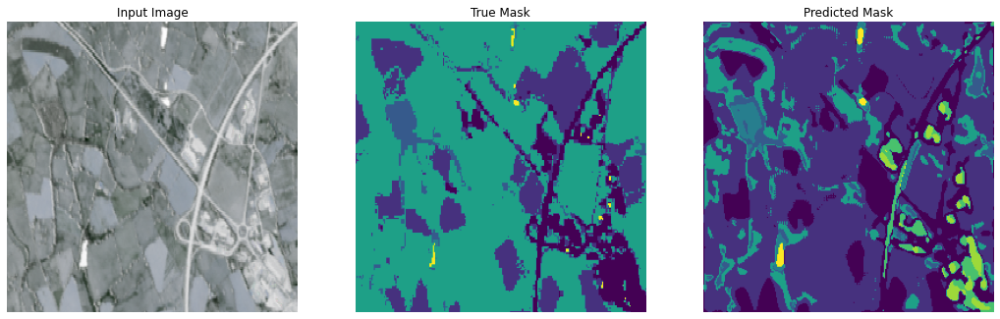

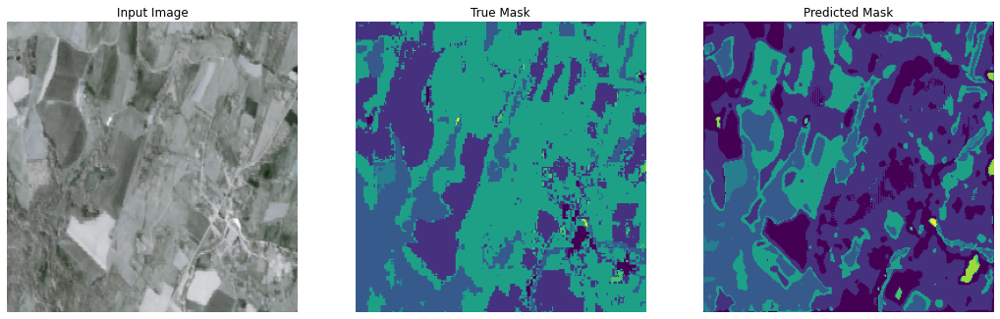

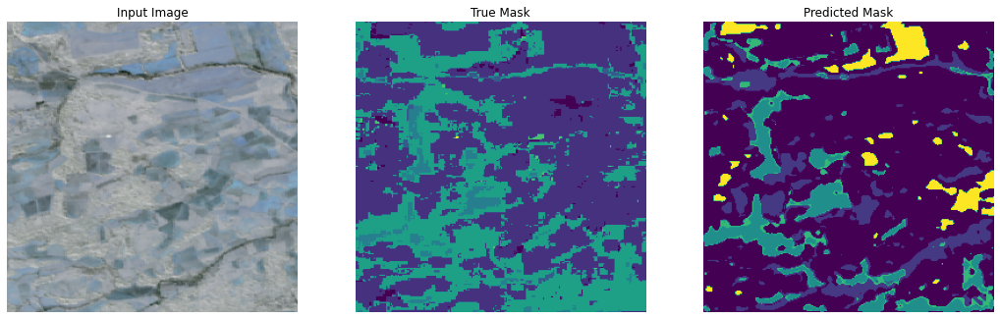

In [3]:
"""
Train the model.
"""
from pathlib import Path
import datetime
import argparse
import yaml
import random
import numpy as np
import pandas as pd
import tensorflow as tf

from dataset import LandCoverData as LCD
from dataset import parse_image, load_image_train, load_image_test
from model import UNet
from tensorflow_utils import plot_predictions
from utils import YamlNamespace

class PlotCallback(tf.keras.callbacks.Callback):
    """A callback used to display sample predictions during training."""
    from IPython.display import clear_output

    def __init__(self, dataset: tf.data.Dataset=None,
                 sample_batch: tf.Tensor=None,
                 save_folder: Path=None,
                 num: int=1,
                 ipython_mode: bool=False):
        super(PlotCallback, self).__init__()
        self.dataset = dataset
        self.sample_batch = sample_batch
        self.save_folder = save_folder
        self.num = num
        self.ipython_mode = ipython_mode

    def on_epoch_begin(self, epoch, logs=None):
        if self.ipython_mode:
            self.clear_output(wait=True)
        if self.save_folder:
            save_filepaths = [self.save_folder/f'plot_{n}_epoch{epoch}.png' for n in range(1, self.num+1)]
        else:
            save_filepaths = None
        plot_predictions(self.model, self.dataset, self.sample_batch, num=self.num, save_filepaths=save_filepaths)


def _parse_args():
    #parser = argparse.ArgumentParser('Training script')
    #parser.add_argument('--config', '-c', type=str, required=True, help="The YAML config file")
    #cli_args = parser.parse_args()
    #cli_args = "--config train_config.yaml"
    # parse the config file
    #with open(cli_args.config, 'r') as f:
    with open('C:/Users/Mohammad/Documents/M2A/AppAuto/challenge-ens/framework/train_config.yaml', 'r') as f:
        config = yaml.load(f, Loader=yaml.FullLoader)
    config = YamlNamespace(config)
    config.xp_rootdir = Path(config.xp_rootdir).expanduser()
    assert config.xp_rootdir.is_dir()
    config.dataset_folder = Path(config.dataset_folder).expanduser()
    assert config.dataset_folder.is_dir()
    if config.val_samples_csv is not None:
        config.val_samples_csv = Path(config.val_samples_csv).expanduser()
        assert config.val_samples_csv.is_file()

    return config

if __name__ == '__main__':

    import multiprocessing

    config = _parse_args()
    print(f'Config:\n{config}')
    # set random seed for reproducibility
    if config.seed is not None:
        random.seed(config.seed)
        np.random.seed(config.seed)
        tf.random.set_seed(config.seed)

    N_CPUS = multiprocessing.cpu_count()

    print('Instanciate train and validation datasets')
    train_files = list(config.dataset_folder.glob('train/images/*.tif'))
    # shuffle list of training samples files
    train_files = random.sample(train_files, len(train_files))
    devset_size = len(train_files)
    # validation set
    if config.val_samples_csv is not None:
        # read the validation samples
        val_samples_s = pd.read_csv(config.val_samples_csv, squeeze=True)
        val_files = [config.dataset_folder/'train/images/{}.tif'.format(i) for i in val_samples_s]
        train_files = [f for f in train_files if f not in set(val_files)]
        valset_size = len(val_files)
        trainset_size = len(train_files)
        assert valset_size + trainset_size == devset_size
    else:
        # generate a hold-out validation set from the training set
        valset_size = int(len(train_files) * 0.1)
        train_files, val_files = train_files[valset_size:], train_files[:valset_size]
        trainset_size = len(train_files) - valset_size

    train_dataset = tf.data.Dataset.from_tensor_slices(list(map(str, train_files)))\
        .map(parse_image, num_parallel_calls=N_CPUS)
    val_dataset = tf.data.Dataset.from_tensor_slices(list(map(str, val_files)))\
        .map(parse_image, num_parallel_calls=N_CPUS)

    train_dataset = train_dataset.map(load_image_train, num_parallel_calls=N_CPUS)\
        .shuffle(buffer_size=1024, seed=config.seed)\
        .repeat()\
        .batch(config.batch_size)\
        .prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

    val_dataset = val_dataset.map(load_image_test, num_parallel_calls=N_CPUS)\
        .repeat()\
        .batch(config.batch_size)\
        .prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

    # where to write files for this experiments
    xp_dir = config.xp_rootdir / datetime.datetime.now().strftime("%d-%m-%Y_%H-%M-%S")
    #xp_dir = config.xp_rootdir
    (xp_dir/'tensorboard').mkdir(parents=True)
    (xp_dir/'plots').mkdir()
    (xp_dir/'checkpoints').mkdir()
    # save the validation samples to a CSV
    val_samples_s = pd.Series([int(f.stem) for f in val_files], name='sample_id', dtype='uint32')
    val_samples_s.to_csv(xp_dir/'val_samples.csv', index=False)

    # keep a training minibatch for visualization
    for image, mask in train_dataset.take(1):
        sample_batch = (image[:5, ...], mask[:5, ...])

    callbacks = [
        PlotCallback(sample_batch=sample_batch, save_folder=xp_dir/'plots', num=5),
        tf.keras.callbacks.TensorBoard(
            log_dir=xp_dir/'tensorboard',
            update_freq='epoch'
        ),
        # tf.keras.callbacks.EarlyStopping(patience=10, verbose=1),
        tf.keras.callbacks.ModelCheckpoint(
            filepath=xp_dir/'checkpoints/epoch{epoch}', save_best_only=False, verbose=1
        ),
        tf.keras.callbacks.CSVLogger(
            filename=(xp_dir/'fit_logs.csv')
        ),
        tf.keras.callbacks.ReduceLROnPlateau(
            patience=20,
            factor=0.5,
            verbose=1,
        )
    ]
    # create the U-Net model to train
    unet_kwargs = dict(
        input_shape=(LCD.IMG_SIZE, LCD.IMG_SIZE, LCD.N_CHANNELS),
        num_classes=LCD.N_CLASSES,
        num_layers=2
    )
    print(f"Creating U-Net with arguments: {unet_kwargs}")
    model = UNet(**unet_kwargs)
    print(model.summary())

    # get optimizer, loss, and compile model for training
    optimizer = tf.keras.optimizers.Adam(lr=config.lr)

    # compute class weights for the loss: inverse-frequency balanced
    # note: we set to 0 the weights for the classes "no_data"(0) and "clouds"(1) to ignore these
    #class_weight = (1 / LCD.TRAIN_CLASS_COUNTS[2:])* LCD.TRAIN_CLASS_COUNTS[2:].sum() / (LCD.N_CLASSES-2)
    class_weight = (1 / LCD.TRAIN_CLASS_COUNTS)* LCD.TRAIN_CLASS_COUNTS.sum() / (LCD.N_CLASSES)
    class_weight[LCD.IGNORED_CLASSES_IDX] = 0.
    print(f"Will use class weights: {class_weight}")

    #class_weights=dict(enumerate(class_weight))
    #class_weight=dict(enumerate(class_weight,1))
   
    #class weighting
    def add_sample_weights(image, label, class_weights=class_weight):
        # The weights for each class, with the constraint that:
        #     sum(class_weights) == 1.0
        #class_weights = tf.constant([2.0, 2.0, 1.0])
        #class_weights = class_weight
        class_weights = class_weights/tf.reduce_sum(class_weights)
        # Create an image of `sample_weights` by using the label at each pixel as an 
        # index into the `class weights` .
        sample_weights = tf.gather(class_weights, indices=tf.cast(label, tf.int32))
        #sample_weights = class_weights
        return (image, label, sample_weights)
    
    
    
#     def weighted_categorical_crossentropy(weights):
#         # weights = [0.9,0.05,0.04,0.01]
#         def wcce(y_true, y_pred):
#             Kweights = tf.keras.constant(weights)
#             if not tf.keras.is_tensor(y_pred): y_pred = tf.keras.constant(y_pred)
#             y_true = tf.keras.cast(y_true, y_pred.dtype)
#             return tf.keras.categorical_crossentropy(y_true, y_pred) * tf.keras.sum(y_true * Kweights, axis=-1)
#         return wcce

    smooth = 1.

#     def dice_coef(y_true, y_pred):
#         y_true_f = K.flatten(y_true)
#         y_pred_f = K.flatten(y_pred)
#         intersection = K.sum(y_true_f * y_pred_f)
#         return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    
    
#     def dice_coef_loss(y_true, y_pred):
#         return 1 - dice_coef(y_true, y_pred)
    
    loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False)
#     wloss=weighted_categorical_crossentropy(class_weights)
    
    print("Compile model")
    model.compile(optimizer=optimizer,
                  loss=loss,
                  metrics=[])
                  # metrics = [tf.keras.metrics.Precision(),
                  #            tf.keras.metrics.Recall(),
                  #            tf.keras.metrics.MeanIoU(num_classes=LCD.N_CLASSES)]) # TODO segmentation metrics

    # Launch training
    model_history = model.fit(train_dataset.map(add_sample_weights), epochs=config.epochs,
    #model_history = model.fit(train_dataset, epochs=config.epochs,
    #model_history = model.fit(train_dataset, sample_weight=class_weight, epochs=config.epochs,                          
                              callbacks=callbacks,
                              steps_per_epoch=trainset_size // config.batch_size,
                              validation_data=val_dataset,
                              validation_steps=valset_size // config.batch_size,
                              #class_weight=class_weights
                              )



In [7]:
tf.keras.backend.clear_session()

In [57]:
class_weight

array([0.00000000e+00, 0.00000000e+00, 5.46819219e-01, 1.57013485e+00,
       4.54326487e-01, 1.54957668e+01, 1.41433886e+05, 5.15142753e+00])

In [56]:
train_dataset.map(add_sample_weights)

<MapDataset shapes: ((None, 256, 256, 4), (None, 256, 256, 1), (None, 256, 256, 1)), types: (tf.float32, tf.uint8, tf.float64)>

In [54]:
class_weight/tf.reduce_sum(class_weight)

<tf.Tensor: shape=(8,), dtype=float64, numpy=
array([0.00000000e+00, 0.00000000e+00, 3.86561864e-06, 1.10997243e-05,
       3.21176154e-06, 1.09543928e-04, 9.99835862e-01, 3.64168880e-05])>

In [47]:
#class wieghting
def add_sample_weights(image, label, class_weights=class_weight):
    # The weights for each class, with the constraint that:
    #     sum(class_weights) == 1.0
    #class_weights = tf.constant([2.0, 2.0, 1.0])
    class_weights = class_weight
    class_weights = class_weights/tf.reduce_sum(class_weights)
    # Create an image of `sample_weights` by using the label at each pixel as an 
    # index into the `class weights` .
    sample_weights = tf.gather(class_weights, indices=tf.cast(label, tf.int32))
    return (image, label, sample_weights)

In [38]:
unet_kwargs

{'input_shape': (256, 256, 4), 'num_classes': 10, 'num_layers': 2}

In [92]:
train_dataset.map(add_sample_weights).element_spec

(TensorSpec(shape=(None, 256, 256, 4), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 256, 256, 1), dtype=tf.uint8, name=None),
 TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float64, name=None))

In [ ]:
"""
Train the model.
"""
from pathlib import Path
import datetime
import argparse
import yaml
import random
import numpy as np
import pandas as pd
import tensorflow as tf

from dataset import LandCoverData as LCD
from dataset import parse_image, load_image_train, load_image_test
from model import UNet
from tensorflow_utils import plot_predictions
from utils import YamlNamespace

class PlotCallback(tf.keras.callbacks.Callback):
    """A callback used to display sample predictions during training."""
    from IPython.display import clear_output

    def __init__(self, dataset: tf.data.Dataset=None,
                 sample_batch: tf.Tensor=None,
                 save_folder: Path=None,
                 num: int=1,
                 ipython_mode: bool=False):
        super(PlotCallback, self).__init__()
        self.dataset = dataset
        self.sample_batch = sample_batch
        self.save_folder = save_folder
        self.num = num
        self.ipython_mode = ipython_mode

    def on_epoch_begin(self, epoch, logs=None):
        if self.ipython_mode:
            self.clear_output(wait=True)
        if self.save_folder:
            save_filepaths = [self.save_folder/f'plot_{n}_epoch{epoch}.png' for n in range(1, self.num+1)]
        else:
            save_filepaths = None
        plot_predictions(self.model, self.dataset, self.sample_batch, num=self.num, save_filepaths=save_filepaths)


def _parse_args():
    #parser = argparse.ArgumentParser('Training script')
    #parser.add_argument('--config', '-c', type=str, required=True, help="The YAML config file")
    #cli_args = parser.parse_args()
    #cli_args = "--config train_config.yaml"
    # parse the config file
    #with open(cli_args.config, 'r') as f:
    with open('C:/Users/Mohammad/Documents/M2A/AppAuto/challenge-ens/framework/train_config.yaml', 'r') as f:
        config = yaml.load(f, Loader=yaml.FullLoader)
    config = YamlNamespace(config)
    config.xp_rootdir = Path(config.xp_rootdir).expanduser()
    assert config.xp_rootdir.is_dir()
    config.dataset_folder = Path(config.dataset_folder).expanduser()
    assert config.dataset_folder.is_dir()
    if config.val_samples_csv is not None:
        config.val_samples_csv = Path(config.val_samples_csv).expanduser()
        assert config.val_samples_csv.is_file()

    return config

if __name__ == '__main__':

    import multiprocessing

    config = _parse_args()
    print(f'Config:\n{config}')
    # set random seed for reproducibility
    if config.seed is not None:
        random.seed(config.seed)
        np.random.seed(config.seed)
        tf.random.set_seed(config.seed)

    N_CPUS = multiprocessing.cpu_count()

    print('Instanciate train and validation datasets')
    train_files = list(config.dataset_folder.glob('train/images/*.tif'))
    # shuffle list of training samples files
    train_files = random.sample(train_files, len(train_files))
    devset_size = len(train_files)
    # validation set
    if config.val_samples_csv is not None:
        # read the validation samples
        val_samples_s = pd.read_csv(config.val_samples_csv, squeeze=True)
        val_files = [config.dataset_folder/'train/images/{}.tif'.format(i) for i in val_samples_s]
        train_files = [f for f in train_files if f not in set(val_files)]
        valset_size = len(val_files)
        trainset_size = len(train_files)
        assert valset_size + trainset_size == devset_size
    else:
        # generate a hold-out validation set from the training set
        valset_size = int(len(train_files) * 0.1)
        train_files, val_files = train_files[valset_size:], train_files[:valset_size]
        trainset_size = len(train_files) - valset_size

    train_dataset = tf.data.Dataset.from_tensor_slices(list(map(str, train_files)))\
        .map(parse_image, num_parallel_calls=N_CPUS)
    val_dataset = tf.data.Dataset.from_tensor_slices(list(map(str, val_files)))\
        .map(parse_image, num_parallel_calls=N_CPUS)

    train_dataset = train_dataset.map(load_image_train, num_parallel_calls=N_CPUS)\
        .shuffle(buffer_size=1024, seed=config.seed)\
        .repeat()\
        .batch(config.batch_size)\
        .prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

    val_dataset = val_dataset.map(load_image_test, num_parallel_calls=N_CPUS)\
        .repeat()\
        .batch(config.batch_size)\
        .prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

    # where to write files for this experiments
    xp_dir = config.xp_rootdir / datetime.datetime.now().strftime("%d-%m-%Y_%H-%M-%S")
    #xp_dir = config.xp_rootdir
    (xp_dir/'tensorboard').mkdir(parents=True)
    (xp_dir/'plots').mkdir()
    (xp_dir/'checkpoints').mkdir()
    # save the validation samples to a CSV
    val_samples_s = pd.Series([int(f.stem) for f in val_files], name='sample_id', dtype='uint32')
    val_samples_s.to_csv(xp_dir/'val_samples.csv', index=False)

    # keep a training minibatch for visualization
    for image, mask in train_dataset.take(1):
        sample_batch = (image[:5, ...], mask[:5, ...])

    callbacks = [
        PlotCallback(sample_batch=sample_batch, save_folder=xp_dir/'plots', num=5),
        tf.keras.callbacks.TensorBoard(
            log_dir=xp_dir/'tensorboard',
            update_freq='epoch'
        ),
        # tf.keras.callbacks.EarlyStopping(patience=10, verbose=1),
        tf.keras.callbacks.ModelCheckpoint(
            filepath=xp_dir/'checkpoints/epoch{epoch}', save_best_only=False, verbose=1
        ),
        tf.keras.callbacks.CSVLogger(
            filename=(xp_dir/'fit_logs.csv')
        ),
        tf.keras.callbacks.ReduceLROnPlateau(
            patience=20,
            factor=0.5,
            verbose=1,
        )
    ]
    # create the U-Net model to train
    unet_kwargs = dict(
        input_shape=(LCD.IMG_SIZE, LCD.IMG_SIZE, LCD.N_CHANNELS),
        num_classes=LCD.N_CLASSES,
        num_layers=2
    )
    print(f"Creating U-Net with arguments: {unet_kwargs}")
    model = UNet(**unet_kwargs)
    print(model.summary())

    # get optimizer, loss, and compile model for training
    optimizer = tf.keras.optimizers.Adam(lr=config.lr)

    # compute class weights for the loss: inverse-frequency balanced
    # note: we set to 0 the weights for the classes "no_data"(0) and "clouds"(1) to ignore these
    #class_weight = (1 / LCD.TRAIN_CLASS_COUNTS[2:])* LCD.TRAIN_CLASS_COUNTS[2:].sum() / (LCD.N_CLASSES-2)
    class_weight = (1 / LCD.TRAIN_CLASS_COUNTS)* LCD.TRAIN_CLASS_COUNTS.sum() / (LCD.N_CLASSES)
    class_weight[LCD.IGNORED_CLASSES_IDX] = 0.
    print(f"Will use class weights: {class_weight}")

    #class_weights=dict(enumerate(class_weight))
    #class_weight=dict(enumerate(class_weight,1))
   
    #class weighting
#     def add_sample_weights(image, label, class_weights=class_unweighted):
#         # The weights for each class, with the constraint that:
#         #     sum(class_weights) == 1.0
#         #class_weights = tf.constant([2.0, 2.0, 1.0])
#         class_weights = class_weight
#         class_weights = class_weights/tf.reduce_sum(class_weights)
#         # Create an image of `sample_weights` by using the label at each pixel as an 
#         # index into the `class weights` .
#         sample_weights = tf.gather(class_weights, indices=tf.cast(label, tf.int32))
#         #sample_weights = class_weights
#         return (image, label, sample_weights)
    
    
    
#     def weighted_categorical_crossentropy(weights):
#         # weights = [0.9,0.05,0.04,0.01]
#         def wcce(y_true, y_pred):
#             Kweights = tf.keras.constant(weights)
#             if not tf.keras.is_tensor(y_pred): y_pred = tf.keras.constant(y_pred)
#             y_true = tf.keras.cast(y_true, y_pred.dtype)
#             return tf.keras.categorical_crossentropy(y_true, y_pred) * tf.keras.sum(y_true * Kweights, axis=-1)
#         return wcce

    smooth = 1.

    def dice_coef(y_true, y_pred):
        y_true_f = K.flatten(y_true)
        y_pred_f = K.flatten(y_pred)
        intersection = K.sum(y_true_f * y_pred_f)
        return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    
    
    def dice_coef_loss(y_true, y_pred):
        return 1 - dice_coef(y_true, y_pred)
    
    loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False)
#     wloss=weighted_categorical_crossentropy(class_weights)
    
    print("Compile model")
    model.compile(optimizer=optimizer,
                  loss=loss,
                  metrics=[])
                  # metrics = [tf.keras.metrics.Precision(),
                  #            tf.keras.metrics.Recall(),
                  #            tf.keras.metrics.MeanIoU(num_classes=LCD.N_CLASSES)]) # TODO segmentation metrics

    # Launch training
    #model_history = model.fit(train_dataset.map(add_sample_weights), epochs=config.epochs,
    model_history = model.fit(train_dataset, epochs=config.epochs,
    #model_history = model.fit(train_dataset, sample_weight=class_weight, epochs=config.epochs,                          
                              callbacks=callbacks,
                              steps_per_epoch=trainset_size // config.batch_size,
                              validation_data=val_dataset,
                              validation_steps=valset_size // config.batch_size,
                              #class_weight=class_weights
                              )



In [2]:
config.xp_rootdir

WindowsPath('C:/Users/Mohammad/Documents/M2A/AppAuto/challenge-ens/code/experiments')

In [4]:
tf.keras.backend.clear_session()

In [5]:
model = tf.keras.models.load_model('C:\\Users\\Mohammad\\Documents\\M2A\\AppAuto\\challenge-ens\\code\\experiments\\21-11-2021_05-10-53\\checkpoints\\epoch32')

In [6]:
model

In [11]:
xp_dir=Path('C:\\Users\\Mohammad\\Documents\\M2A\\AppAuto\\challenge-ens\\code\\experiments\\Final')

In [ ]:
callbacks = [
    PlotCallback(sample_batch=sample_batch, save_folder=xp_dir/'plots', num=5),
    tf.keras.callbacks.TensorBoard(
        log_dir=xp_dir/'tensorboard',
        update_freq='epoch'
    ),
    # tf.keras.callbacks.EarlyStopping(patience=10, verbose=1),
    tf.keras.callbacks.ModelCheckpoint(
        filepath=xp_dir/'checkpoints/epoch{epoch}', save_best_only=False, verbose=1
    ),
    tf.keras.callbacks.CSVLogger(
        filename=(xp_dir/'fit_logs.csv')
    ),
    tf.keras.callbacks.ReduceLROnPlateau(
        patience=20,
        factor=0.5,
        verbose=1,
    )
]

model_history = model.fit(train_dataset, epochs=68,
   #model_history = model.fit(train_dataset, sample_weight=class_weight, epochs=config.epochs,                          
                          callbacks=callbacks,
                          steps_per_epoch=trainset_size // config.batch_size,
                          validation_data=val_dataset,
                          validation_steps=valset_size // config.batch_size,
                          #class_weight=class_weights
                          )